# Proyecto de Ciencia de Datos: Predicción de Precios de Casas.

Este proyecto de ciencia de datos y aprendizaje automático trata de crear un modelo predictivo que pueda estimar los precios de un conjunto de casas en algún lugar del mundo. El enfoque inicial de este proyecto dado por **Kaggle**, es realizar la mejor **Ingeniería de Predictores** para que con ello, se pueda llegar al objetivo antes mencionado para este notebook.

## Comprensión del Problema

### Definición del Objetivo

El objetivo de este problema son:

* Predecir los precios de casas, usando como métrica la **Raíz del Error Cuadrático Médio (RMSE)**.

* Poner en práctica técnicas de **Selección de Características**.

## Exploración Inicial de los Datos

### Cargando y Revisando los Datos

Este problema inicialmente viene con los datasets de entrenamiento y de prueba ya separados. En consecuencia, se cargarán ambos datasets utilizando **Pandas**.

In [1]:
# Importando Pandas para el manejo completo de los datos

import pandas as pd
import warnings
warnings.filterwarnings('ignore')


# Importando los datos; df_train son los datos de entrenamiento y df_test son los de prueba

df_train = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')

df_test = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv')



# Mirando la forma de los dos datasets

print("Tamaño del Conjunto de Entrenamiento: ",df_train.shape)

print("Tamaño del Conjunto de Prueba       : ",df_test.shape)

Tamaño del Conjunto de Entrenamiento:  (1460, 81)
Tamaño del Conjunto de Prueba       :  (1459, 80)


In [2]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
print(f'Cantidad de Variables Categóricas Inicial: {(df_train.dtypes == "object").sum()}')

print(f'Cantidad de Variables Métricas Inicial   : {(df_train.dtypes != "object").sum()}')

Cantidad de Variables Categóricas Inicial: 43
Cantidad de Variables Métricas Inicial   : 38


In [5]:
# Un diccionario con las variables categóricas

datos_categoricos = {

    "MSSubClass"    : [20,30,40,45,50,60,70,75,80,85,90,120,150,160,180,190],

    "MSZoning"      : ["A","C","FV","I","RH","RL","RP","RM"],

    "Street"        : ["Grvl","Pave"],

    "Alley"         : ["Grvl","Pave","NA"],

    "LotShape"      : ["Reg","IR1","IR2","IR3"],

    "LandContour"   : ["Lvl","Bnk","HLS","Low"],

    "Utilities"     : ["AllPub","NoSewr","NoSeWa","ELO"],

    "LotConfig"     : ["Inside","Corner","CulDSac","FR2","FR3"],

    "LandSlope"     : ["Gtl","Mod","Sev"],

    "Neighborhood"  : ["Blmngtn","Blueste","BrDale","BrkSide","ClearCr","CollgCr","Crawfor","Edwards","Gilbert","IDOTRR","MeadowV","Mitchel",

                       "Names","NoRidge","NPkVill","NridgHt","NWAmes","OldTown","SWISU","Sawyer","SawyerW","Somerst","StoneBr","Timber",

                       "Veenker"],

    "Condition1"    : ["Artery","Feedr","Norm","RRNn","RRAn","PosN","PosA","RRNe","RRAe"],

    "Condition2"    : ["Artery","Feedr","Norm","RRNn","RRAn","PosN","PosA","RRNe","RRAe"],

    "BldgType"      : ["1Fam","2FmCon","Duplx","TwnhsE","TwnhsI"],

    "HouseStyle"    : ["1Story","1.5Fin","1.5Unf","2Story","2.5Fin","2.5Unf","SFoyer","SLvl"],

    "OverallQual"   : [10,9,8,7,6,5,4,3,2,1],

    "OverallCond"   : [10,9,8,7,6,5,4,3,2,1],

    "RoofStyle"     : ["Flat","Gable","Gambrel","Hip","Mansard","Shed"],

    "RoofMatl"      : ["ClyTile","CompShg","Membran","Metal","Roll","Tar&Grv","WdShake","WdShngl"],

    "Exterior1st"   : ["AsbShng","AsphShn","BrkComm","BrkFace","CBlock","CemntBd","HdBoard","ImStucc","MetalSd","Other","Plywood","PreCast",

                       "Stone","Stucco","VinylSd","Wd Sdng","WdShing"],

    "Exterior2nd"   : ["AsbShng","AsphShn","BrkComm","BrkFace","CBlock","CemntBd","HdBoard","ImStucc","MetalSd","Other","Plywood","PreCast",

                       "Stone","Stucco","VinylSd","Wd Sdng","WdShing"],

    "MasVnrType"    : ["BrkCmn","BrkFace","CBlock","None","Stone"],

    "ExterQual"     : ["Ex","Gd","TA","Fa","Po"],

    "ExterCond"     : ["Ex","Gd","TA","Fa","Po"],

    "Foundation"    : ["BrkTil","CBlock","PConc","Slab","Stone","Wood"],

    "BsmtQual"      : ["Ex","Gd","TA","Fa","Po","NA"],

    "BsmtCond"      : ["Ex","Gd","TA","Fa","Po","NA"],

    "BsmtExposure"  : ["Gd","Av","Mn","No","NA"],

    "BsmtFinType1"  : ["GLQ","ALQ","BLQ","Rec","LwQ","Unf","NA"],

    "BsmtFinType2"  : ["GLQ","ALQ","BLQ","Rec","LwQ","Unf","NA"],

    "Heating"       : ["Floor","GasA","GasW","Grav","OthW","Wall",""],

    "HeatingQC"     : ["Ex","Gd","TA","Fa","Po"],

    "CentralAir"    : ["N","Y"],

    "Electrical"    : ["SBrkr","FuseA","FuseF","FuseP","Mix"],

    "KitchenQual"   : ["Ex","Gd","TA","Fa","Po"],

    "Functional"    : ["Typ","Min1","Min2","Mod","Maj1","Maj2","Sev","Sal"],

    "FireplaceQu"   : ["Ex","Gd","TA","Fa","Po","NA"],

    "GarageType"    : ["2Types","Attchd","Basment","BuiltIn","CarPort","Detchd","NA"],

    "GarageFinish"  : ["Fin","RFn","Unf","NA"],

    "GarageQual"    : ["Ex","Gd","TA","Fa","Po","NA"],

    "GarageCond"    : ["Ex","Gd","TA","Fa","Po","NA"],

    "PavedDrive"    : ["Y","P","N"],

    "PoolQC"        : ["Ex","Gd","TA","Fa","NA"],

    "Fence"         : ["GdPrv","MnPrv","GdWo","MnWw","NA"],

    "MiscFeature"   : ["Elev","Gar2","Othr","Shed","TenC","NA"],

    "SaleType"      : ["WD","CWD","VWD","New","COD","Con","ConLw","ConLI","ConLD","Oth"],

    "SaleCondition" : ["Normal","Abnorml","AdjLand","Alloca","Family","Partial"]

}



# Clasificando las variables métricas

vars_metricas = [

    "LotFrontage",

    "LotArea",

    "YearBuilt",

    "YearRemodAdd",

    "MasVnrArea",

    "BsmtFinSF1",

    "BsmtFinSF2",

    "BsmtUnfSF",

    "TotalBsmtSF",

    "1stFlrSF",

    "2ndFlrSF",

    "LowQualFinSF",

    "GrLivArea",

    "BsmtFullBath",

    "BsmtHalfBath",

    "FullBath",

    "HalfBath",

    "BedroomAbvGr",

    "KitchenAbvGr",

    "TotRmsAbvGrd",

    "Fireplaces",

    "GarageYrBlt",

    "GarageCars",

    "GarageArea",

    "WoodDeckSF",

    "OpenPorchSF",

    "EnclosedPorch",

    "3SsnPorch",

    "ScreenPorch",

    "PoolArea",

    "MiscVal",

    "MoSold",

    "YrSold",

    "SalePrice"

]



# Clasificando las variables categóricas

vars_categoricas = list(datos_categoricos.keys())



print(f'Cantidad de Variables Categóricas Reales: {len(vars_categoricas)}')

print(f'Cantidad de Variables Métricas    Reales: {len(vars_metricas)}')

Cantidad de Variables Categóricas Reales: 46
Cantidad de Variables Métricas    Reales: 34


De la **exploración inicial de los datos**, pude obtener la siguiente información:

* El conjunto de datos se compone de **81 variables**

* Una de las variables presentes representa la ***ID*** de cada muestra

* Hay en total 78 predictores (variables independientes) si sacamos la variable **ID**, ya que no entrega ninguna información predictora.

* Los conjuntos de datos de entrenamiento y de prueba tienen alrededor de **la misma cantidad de muestras (filas)**

* Existen **46 variables categóricas** y **34 variables métricas**

### Visualización Inicial

Para la visualización inicial de los datos, se utilizarán las herramientas de **Seaborn** y **Matplotlib**.

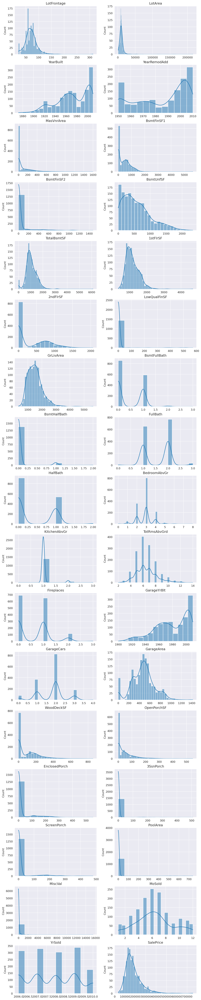

In [6]:
# Importando la visualización

import matplotlib.pyplot as plt

import seaborn as sns

sns.set_style("darkgrid") # ----> Configurando el estilo de los gráficos



# Importando Numpy para hacer mejor el ciclo for

import numpy as np



# Visualizando la distribución de las variables numéricas

def Histogramas(datos):

    if 'SalePrice' in datos.columns:

        plt.figure(figsize=(10,50),layout='constrained',dpi=180) # ----> Configuración de la figura



        # El ciclo for que me grafica cada una de las variables métricas

        for plot,ax in zip(vars_metricas,np.arange(34) + 1):

            plt.subplot(17,2,ax)

            sns.histplot(datos[plot],kde = True)

            plt.title(plot)

            plt.xlabel(None)

    else:

        plt.figure(figsize=(10,50),layout='constrained',dpi=180) # ----> Configuración de la figura



        # El ciclo for que me grafica cada una de las variables métricas

        for plot,ax in zip(vars_metricas[:33],np.arange(34) + 1):

            plt.subplot(17,2,ax)

            sns.histplot(datos[plot],kde = True)

            plt.title(plot)

            plt.xlabel(None)

        

Histogramas(df_train)

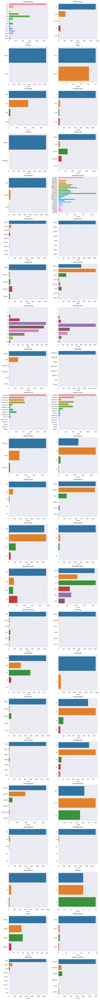

In [7]:
# Función para crear gráficos categóricos

def graficos_categoricos(datos):

    plt.figure(figsize=(10,100),layout='constrained',dpi=180)

    

    for plot,ax in zip(vars_categoricas,np.arange(46) + 1):

        plt.subplot(int(46/2),2,ax)

        sns.countplot(y=datos[plot])

        plt.title(plot)

        plt.ylabel(None)

    

graficos_categoricos(df_train)

In [8]:
# Aquí voy a realizar una prueba de hipótesis para probar definitivamente la normalidad de las variables métricas, y así complementar los gráficos

from scipy import stats



# Realizando una prueba de hipótesis Kolmogorov-Smirnov, con esto de podrá comprobar definitivamente la normalidad de mis datos para futuras pruebas

Resultado_KormorovSmirnov = []

for x in vars_metricas:

    statistic, p_value = stats.kstest(df_train[x].dropna(),'norm')

    if p_value >= 0.05:

        Resultado_KormorovSmirnov.append(x)



if len(Resultado_KormorovSmirnov) != 0:

    print('Estas variables métricas tiene una distribución normal, dado que no hubo evidencia suficiente para rechazar la hipótesis nula no normalidad:')

    for x in Resultado_KormorovSmirnov:

        print(x)

else:

    print('Ninguna de las variables métricas sigue una distribución normal dado los resultados de la prueba de Kormorov-Smirnov')

Ninguna de las variables métricas sigue una distribución normal dado los resultados de la prueba de Kormorov-Smirnov


Se puede observar que:

* **Las variables métricas no siguen una distribución normal**, lo que se puede comprobar observando las distribuciones como también con la prueba empírica de Kormorov-Smirnov.

* Con las variables categóricas, hay algunas que tienen una variabilidad en sus valores, mientras que otras tienen clases desbalanceadas, sin embargo esto no debería ser mucho problema dado que se está realizando un estudio de regresión.

### Evaluando la Presencia de Valores Faltantes, Duplicados y Outliers

Lo primero a revisar será la presencia de valores faltantes en ambos conjuntos, lo que es evidente dada la revision inicial de los datos:

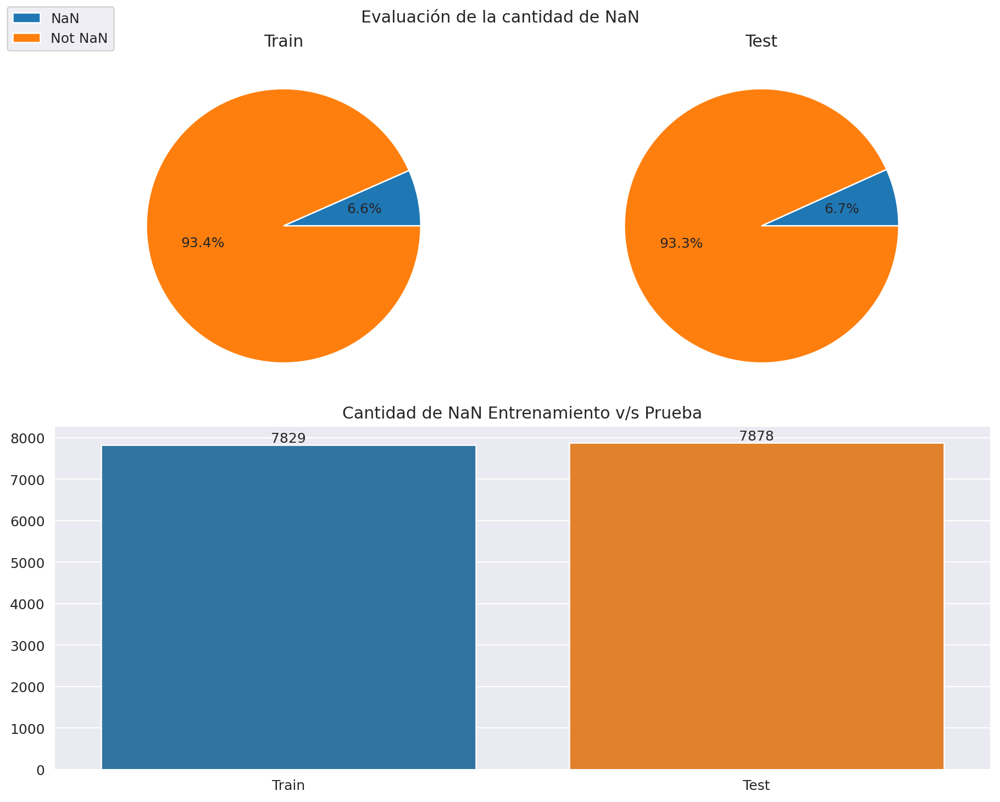

In [9]:
# Creando una tabla de visualizacion de los NaN en cada conjunto de datos

cant_nan = {

    "Train" : [df_train.isnull().sum().sum(),df_train.notnull().sum().sum()],

    "Test"  : [df_test.isnull().sum().sum(),df_test.notnull().sum().sum()]

}



cant_nan = pd.DataFrame(cant_nan,index = ['NaN', 'Not NaN'])



# Visualizando el total de NaN en cada conjunto

fig = plt.figure(

    layout  = 'constrained',

    figsize = (10,8),

    dpi     = 180

)

ax = fig.subplot_mosaic(

    [['NaN Train'     ,'NaN Test'      ],

     ['NaN Train-Test','NaN Train-Test']]

)



plt.suptitle('Evaluación de la cantidad de NaN')



for y,plot in zip(cant_nan.columns,['NaN Train','NaN Test']):

    cant_nan.plot.pie(

        y       = y,

        ax      = ax[plot],

        autopct = '%.1f%%',

        labels  = None,

        title   = y,

        legend  = False

    )

    ax[plot].set_ylabel(None)



ax['NaN Train-Test'] = sns.barplot(

    x = cant_nan.loc['NaN'].index,

    y = cant_nan.loc['NaN'].values

)

ax['NaN Train-Test'].bar_label(ax['NaN Train-Test'].containers[0])

ax['NaN Train-Test'].set_title('Cantidad de NaN Entrenamiento v/s Prueba')



fig.legend(

    labels = cant_nan.index,

    loc    = 'upper left'

);

Se puede apreciar que:

* La cantidad de valores nulos presentes en los conjuntos de entrenamiento y prueba representan alrededor del **6% de los datos** cada uno

* El conjunto de prueba contiene una mayor cantidad de valores nulos, teniendo **35 datos faltantes más que el de entrenamiento**

Ahora se revisará en detalle que variables contienen datos faltantes en ambos conjuntos, empezando primero con el conjunto de entrenamiento:

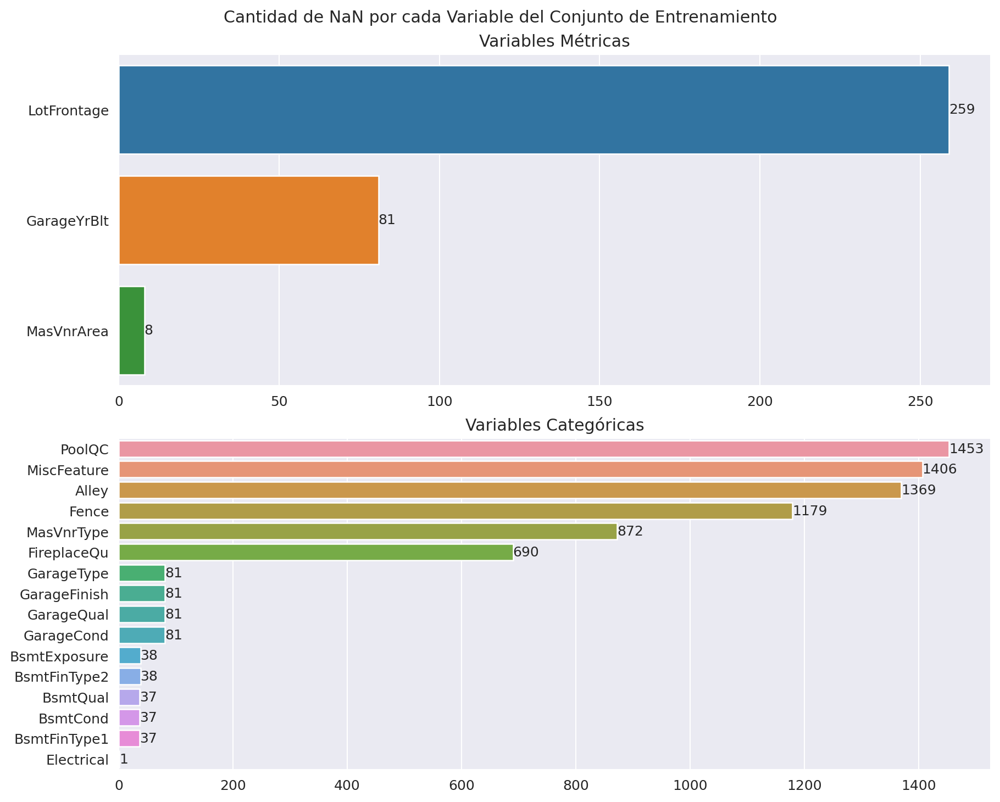

In [10]:
# Separando los predictores que contienen NaN en variables métricas y categóricas; vars_met_con_nan corresponde a las variables métricas y vars_cat_con_nan a las variables categóricas

def vars_met_nan(datos):

    return datos.isna().sum()[datos.isna().sum() > 0][datos.dtypes != 'O']



def vars_cat_nan(datos):

    return datos.isna().sum()[datos.isna().sum() > 0][datos.dtypes == 'O']



# Visualizando los datos

fig,ax = plt.subplots(2,1,figsize = (10,8),dpi = 180,layout = 'constrained')

fig.suptitle('Cantidad de NaN por cada Variable del Conjunto de Entrenamiento')



ax[0].set_title('Variables Métricas')

sns.barplot(

    x  = vars_met_nan(df_train).sort_values(ascending = False).values,

    y  = vars_met_nan(df_train).sort_values(ascending = False).index,

    ax = ax[0]

)

ax[0].bar_label(ax[0].containers[0])



ax[1].set_title('Variables Categóricas')

sns.barplot(

    x  = vars_cat_nan(df_train).sort_values(ascending = False).values,

    y  = vars_cat_nan(df_train).sort_values(ascending = False).index,

    ax = ax[1]

)

ax[1].bar_label(ax[1].containers[0]);

Se puede apreciar que en el conjunto de entrenamiento:

* Hay más variables categóricas que métricas con datos faltantes

* Al mismo tiempo, las variables categóricas contienen un mayor número de datos faltantes

Ahora revisaré el conjunto de prueba.

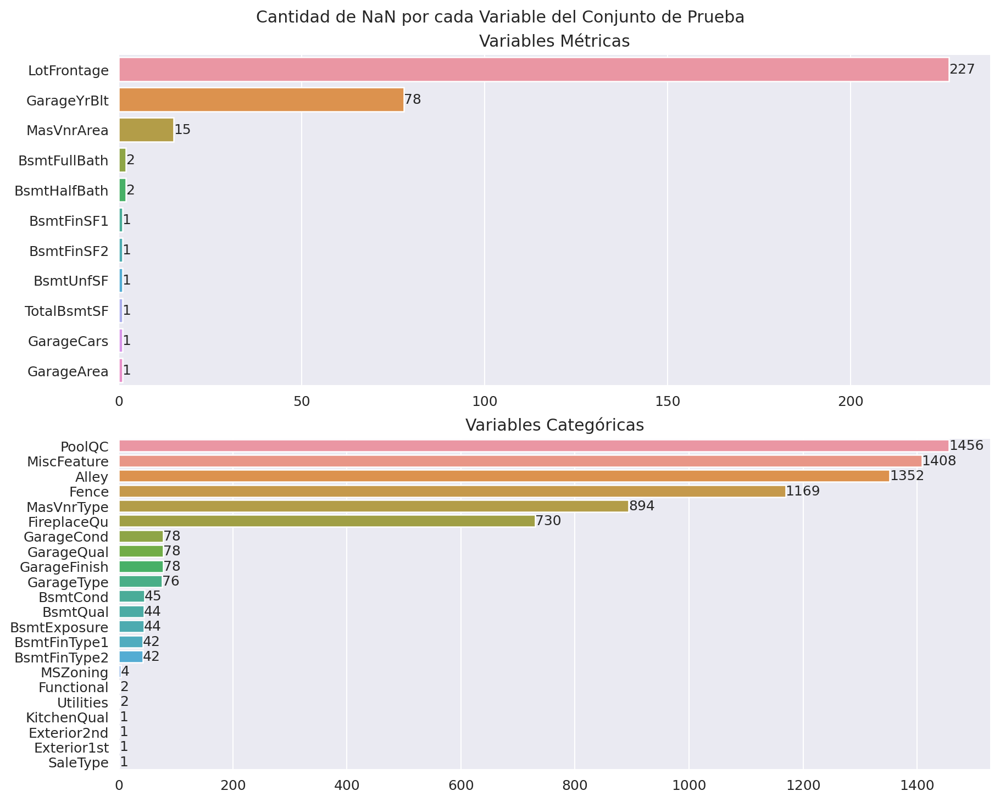

In [11]:
# La visualización

fig,ax = plt.subplots(2,1,figsize = (10,8), dpi = 180, layout = 'constrained')

fig.suptitle('Cantidad de NaN por cada Variable del Conjunto de Prueba')



ax[0].set_title('Variables Métricas')

sns.barplot(

    x  = vars_met_nan(df_test).sort_values(ascending = False).values,

    y  = vars_met_nan(df_test).sort_values(ascending = False).index,

    ax = ax[0]

)

ax[0].bar_label(ax[0].containers[0])



ax[1].set_title('Variables Categóricas')

sns.barplot(

    x  = vars_cat_nan(df_test).sort_values(ascending = False).values,

    y  = vars_cat_nan(df_test).sort_values(ascending = False).index,

    ax = ax[1]

)

ax[1].bar_label(ax[1].containers[0]);

En el conjunto de prueba se puede notar que:

* Tiene más variables con datos faltantes que el conjunto de entrenamiento

* Hay más variables categóricas que métricas con datos faltantes

* Los datos faltantes también están concentrados en las variables categóricas

**Detallada la presencia de datos faltantes**, se procede a revisar la existencia de **valores atípicos (Outliers)** en las variables métricas:

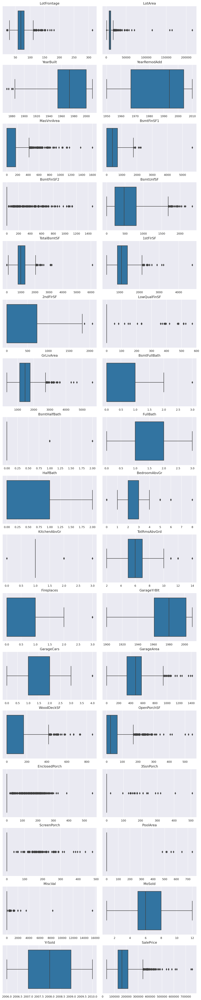

In [12]:
# Definiendo una función para graficar boxplot y asi ver outliers

fig = plt.figure(figsize=(10,50),dpi = 180,layout = 'constrained')

for x,y in zip(vars_metricas,np.arange(34) + 1):

    plt.subplot(17,2,y)

    sns.boxplot(x = df_train[x])

    plt.title(x)

    plt.xlabel(None)

Se puede ver que la mayoría de las variables métricas contienen **una cantidad considerable de Outliers** a tener en cuenta. Ahora se revisará la existencias de registros duplicados:

In [13]:
# Evaluando la cantidad de muestras duplicadas

print(f'Cantidad de filas duplicadas en el conjunto de entrenamiento: {df_train.duplicated().sum()}')

print(f'Cantidad de filas duplicadas en el conjunto de prueba: {df_test.duplicated().sum()}')

Cantidad de filas duplicadas en el conjunto de entrenamiento: 0
Cantidad de filas duplicadas en el conjunto de prueba: 0


Se puede notar que ninguno de los conjuntos de datos contienen registros duplicados. Ahora se procederá a **evaluar posibles errores de registro** en ambos datasets, comenzando por el conjunto de entrenamiento:.

In [14]:
# Descubriendo cuales variables categóricas tienen errores y cuales son

def err_cat(datos):

    errores_categoricos = {}



    for x in vars_categoricas:

        for y in datos[x].value_counts().index:

            if y not in datos_categoricos[x]:

                if x not in errores_categoricos:

                    errores_categoricos[x] = []

                errores_categoricos[x].append(y)





    if len(errores_categoricos) > 0:

        print(f'Hay {len(errores_categoricos)} variables con errores y son: \n')

        for x,y in zip(errores_categoricos.keys(),errores_categoricos.values()):

            print(x,y)

    else:

        print('No hay errores en las variables categóricas')



err_cat(df_train)

Hay 4 variables con errores y son: 

MSZoning ['C (all)']
Neighborhood ['NAmes']
BldgType ['Duplex', 'Twnhs', '2fmCon']
Exterior2nd ['CmentBd', 'Wd Shng', 'Brk Cmn']


In [15]:
# Revisando que ninguna variable métrica tenga valores negativos

def err_met(datos):

    errores_metricos = 0

    predictores = vars_metricas[:33]

    for x in predictores:

        for y in datos[x]:

            if y < 0:

                errores_metricos += 1



    if errores_metricos > 0:

        print(f'Existen valores negativos en las mediciones, son {errores_metricos} variables')



    else:

        print('No existen variables con mediciones negativas')



err_met(df_train)

No existen variables con mediciones negativas


In [16]:
# Revisando si alguna variable con información de los años no sea mayor al año actual

def err_met_yr(datos):

    errores_metricos = {}



    variables_anuales = [

        'YearBuilt',

        'YearRemodAdd',

        'GarageYrBlt',

        'YrSold'

    ]



    for x in variables_anuales:

        for y in datos[x]:

            if y > 2024:

                if x not in errores_metricos:

                    errores_metricos[x] = []

                

                errores_metricos[x] += [y]



    if len(errores_metricos) > 0:

        print(f'Hay {len(errores_metricos)} variables métricas con valores erroneos')

        

        for x,y in zip(errores_metricos.keys(),errores_metricos.values()):

            print(x,y)

            

    else:

        print('No hay ninguna variable métrica con errores')



err_met_yr(df_train)

No hay ninguna variable métrica con errores


Ahora se procederá con los datos de prueba:

In [17]:
# Errores categorícos

err_cat(df_test)

print('\n')



# Errores métricos

err_met(df_test)

print('\n')



# Errores con los años

err_met_yr(df_test)

Hay 4 variables con errores y son: 

MSZoning ['C (all)']
Neighborhood ['NAmes']
BldgType ['Duplex', 'Twnhs', '2fmCon']
Exterior2nd ['CmentBd', 'Wd Shng', 'Brk Cmn']


No existen variables con mediciones negativas


Hay 1 variables métricas con valores erroneos
GarageYrBlt [2207.0]


Como último paso, se procederá revisar estadísticas descriptivas de las variables métricas:

In [18]:
df_train[vars_metricas].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0
BsmtUnfSF,1460.0,567.240411,441.866955,0.0,223.00,477.5,808.00,2336.0
TotalBsmtSF,1460.0,1057.429452,438.705324,0.0,795.75,991.5,1298.25,6110.0
1stFlrSF,1460.0,1162.626712,386.587738,334.0,882.00,1087.0,1391.25,4692.0


### Conclusión

De la evaluación puedo sacar las siguientes conclusiones:

* **Hay que limpiar ambos conjuntos de datos**.

* El conjunto de Prueba contiene más errores y valores faltantes que el de entrenamiento.

* Existen varias variables métricas con **mediana 0** a diferencia de sus medias que son mucho más altas.

* Hay una gran presencia outliers en las variables métricas.

* No hay registros duplicados, pero si errores de registro que tienen que ser corregidos.

## Prepararación y Limpieza de los Datos

### Tratando los Valores Faltantes

Para empezar la preparación de los datos, se comenzará tratando los valores faltantes. Para ello, se **imputará con la mediana y la moda** a las variables métricas y categóricas respectivamente. La razón esto es tratar de ser lo más robusto y preciso a la hora de armar el modelo de Machine Learnig debido a la existencia de **Outliers** en los datos. Se tiene entonces lo siguiente:

In [19]:
# Copiando los datasets y separandolos

X_train = df_train.copy().drop(['Id','SalePrice'],axis = 1) # ---> Los Predictores de Entrenamiento 

y_train = df_train.copy()['SalePrice'] # -----> El Objetivo de Entrenamiento

X_test = df_test.copy().drop(['Id'],axis = 1) # ----> Los Predictores de Prueba



# Las variables con NaN conocidos

NaN_conocidos = [

    'Alley',

    'BsmtQual',

    'BsmtCond',

    'BsmtExposure',

    'BsmtFinType1',

    'BsmtFinType2',

    'FireplaceQu',

    'GarageType',

    'GarageFinish',

    'GarageQual',

    'GarageCond',

    'PoolQC',

    'Fence',

    'MiscFeature'

]



# Imputando los valores faltantes en ambos conjuntos

def imputacion(datos):

    mediana = X_train[vars_met_nan(datos).index].agg('median') # ---> La Mediana

    moda = X_train[vars_cat_nan(datos).index].agg('mode').transpose()[0] # ---> La Moda

    

    # Imputación de los NaN conocidos

    datos[NaN_conocidos] = datos[NaN_conocidos].fillna('NA')

    

    # Imputacion de GarageYrBlt como caso especial

    datos['GarageYrBlt'] = datos['GarageYrBlt'].fillna(datos['YearBuilt'])

    

    # Imputacion de las variables métricas con la mediana

    datos[vars_met_nan(datos).index] = datos[vars_met_nan(datos).index].fillna(mediana)

    

    # Imputacion de las variables categóricas con la moda

    datos[vars_cat_nan(datos).index] = datos[vars_cat_nan(datos).index].fillna(moda)

    

for x in [X_train,X_test]:

    imputacion(x)

    

print(f'Número de NaN Actuales en el Conjunto de Entrenamiento: {X_train.isnull().sum().sum()}')

print(f'Número de NaN Actuales en el Conjunto de Prueba: {X_test.isnull().sum().sum()}')

Número de NaN Actuales en el Conjunto de Entrenamiento: 0
Número de NaN Actuales en el Conjunto de Prueba: 0


### Corrección de Errores

Ahora se comienzará con la corrección de errores de cada registro en ambos datasets:

In [20]:
print('------Conjunto de Entrenamiento------')

print('-> Errores Categóricos')

err_cat(X_train)

print('\n')

print('------Conjunto de Prueba------')

print('-> Errores Categóricos')

err_cat(X_test)

print('\n')

print('-> Errores Métricos')

err_met_yr(X_test)

------Conjunto de Entrenamiento------
-> Errores Categóricos
Hay 4 variables con errores y son: 

MSZoning ['C (all)']
Neighborhood ['NAmes']
BldgType ['Duplex', 'Twnhs', '2fmCon']
Exterior2nd ['CmentBd', 'Wd Shng', 'Brk Cmn']


------Conjunto de Prueba------
-> Errores Categóricos
Hay 4 variables con errores y son: 

MSZoning ['C (all)']
Neighborhood ['NAmes']
BldgType ['Duplex', 'Twnhs', '2fmCon']
Exterior2nd ['CmentBd', 'Wd Shng', 'Brk Cmn']


-> Errores Métricos
Hay 1 variables métricas con valores erroneos
GarageYrBlt [2207.0]


In [21]:
# Reemplazando los valores erroneos

def correcciones(datos):

    variables = ['MSZoning','Neighborhood','BldgType','Exterior2nd','GarageYrBlt']

    correccion = [

        {'C (all)' : 'C'},

        {'NAmes'   : 'Names'},

        {'Duplex'  : 'Duplx',

         'Twnhs'   : 'TwnhsI',

         '2fmCon'  : '2FmCon'},

        {'CmentBd' : 'CemntBd',

         'Wd Shng' : 'WdShing',

         'Brk Cmn' : 'BrkComm'},

        {2207.0    : 2007.0}

    ] 

    

    for variable,remplazo in zip(variables,correccion):

        datos[variable] = datos[variable].replace(remplazo)



for x in [X_train,X_test]:

    correcciones(x)

    

print('------Conjunto de Entrenamiento------')

print('-> Errores Categóricos')

err_cat(X_train)

print('\n')

print('------Conjunto de Prueba------')

print('-> Errores Categóricos')

err_cat(X_test)

print('\n')

print('-> Errores Métricos')

err_met_yr(X_test)

------Conjunto de Entrenamiento------
-> Errores Categóricos
No hay errores en las variables categóricas


------Conjunto de Prueba------
-> Errores Categóricos
No hay errores en las variables categóricas


-> Errores Métricos
No hay ninguna variable métrica con errores


Al último, se va a corregir los tipos de datos correspondientes a dos variables de ambos datasets:

In [22]:
# Corrigiendo los predictores categóricos

X_train[vars_categoricas] = X_train[vars_categoricas].astype('O')

X_test[vars_categoricas] = X_test[vars_categoricas].astype('O')

### Transformación de los Datos

Para tener mejores resultados, y además mantener una buena práctica, se realizaran transformaciones y escalado a los datos, con el fin de que los modelos de Machine Learning puedan interpretar mejor los registros. Además, esto ayudará a reducir el impacto negativo que puedan tener los outliers como la no normalidad de los datos.

#### Escalado de los datos

En esta ocasión, se revisará nuevamente las distribuciones de los datos métricos, pero esta vez ya imputados y corregidos:

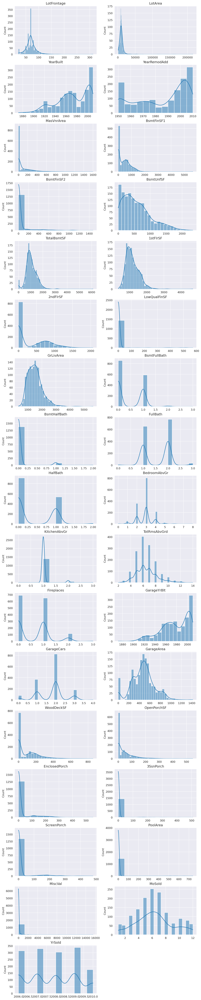

In [23]:
Histogramas(X_train)

Se puede ver que:

* **Variables Sesgadas**: Hay variables que presentan mucha asimetría, teniendo que algunas es una asimetría extrema.

* **No hay Normalidad**: Tal como se comprobó al inicio, las variables métricas no se distribuyen normalmente.



Para arreglar esta situación, se usará la **transformación por Quintiles**, para así:

* **Combatir:** 

    * **La Asimetría**

    * **Los Outliers**

    * **El Desbordamiento Numérico debido a las escalas muy grandes que presentan algunas Variables**

* **Aproximar las variables a una Distribución Normal**

In [24]:
# Importar las herramientas de Sciki-learn

from sklearn.preprocessing import QuantileTransformer



# Escalando los datos

scaler = QuantileTransformer(output_distribution='normal')



X_train_met_scaled = pd.DataFrame() # -> Datos de Entrenamiento

X_test_met_scaled = pd.DataFrame() # -> Datos de Prueba



X_train_met_scaled[X_train[vars_metricas[:33]].columns] = scaler.fit_transform(X_train[vars_metricas[:33]])

X_test_met_scaled[X_test[vars_metricas[:33]].columns] = scaler.transform(X_test[vars_metricas[:33]])

Para ver el resultado de las transformaciones, procedo a graficar mis datos:

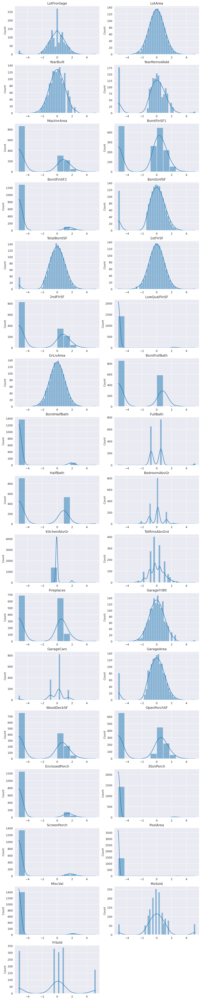

In [25]:
Histogramas(X_train_met_scaled)

In [26]:
variables_normales = []

variables_no_norma = []



for x in vars_metricas[:33]:

    statistic, p_value = stats.kstest(X_train_met_scaled[x].dropna(),'norm')

    if p_value >= 0.05:

        variables_normales.append(x)

    else:

        variables_no_norma.append(x)

Dada la prueba de normalidad K-S y los histogramas, se puede observar que las siguientes variables tienen y no distribucion normal:

In [27]:
print('Variables con distribución normal:')

for x in variables_normales:

    print(x)

print('\n')

print('Variables con distribución no normal:')

for x in variables_no_norma:

    print(x)

Variables con distribución normal:
LotArea
YearBuilt
TotalBsmtSF
1stFlrSF
GrLivArea
GarageYrBlt


Variables con distribución no normal:
LotFrontage
YearRemodAdd
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
2ndFlrSF
LowQualFinSF
BsmtFullBath
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
TotRmsAbvGrd
Fireplaces
GarageCars
GarageArea
WoodDeckSF
OpenPorchSF
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
MiscVal
MoSold
YrSold


A partir de aquí, se pueden hacer pruebas de correlación para observar que variables están relacionadas con el target. Primero se procede a ver la correlación de las variables normales:

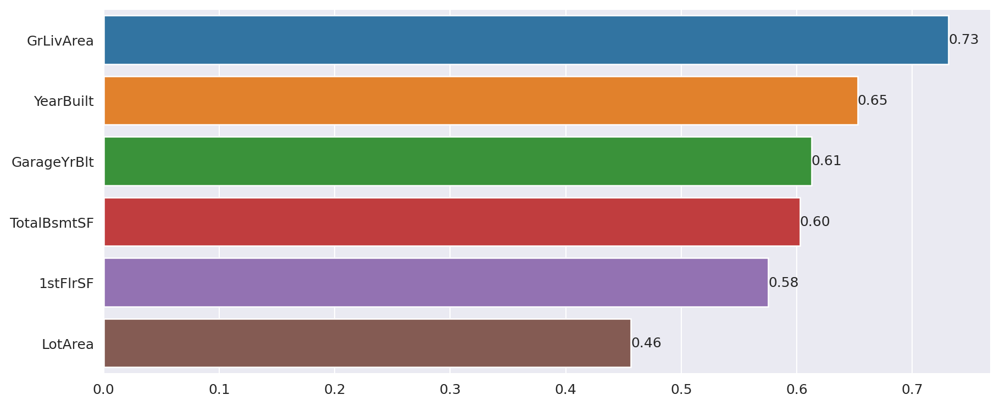

In [28]:
X_train_met_scaled['SalePrice'] = df_train['SalePrice']

Corr_S = X_train_met_scaled[variables_normales+['SalePrice']].corr('spearman')['SalePrice'].sort_values(ascending=False).drop(['SalePrice'],axis=0)



fig = plt.figure(

    layout  = 'constrained',

    figsize = (10,4),

    dpi     = 180

)

ax = sns.barplot(x=Corr_S.values,y=Corr_S.index)

ax.bar_label(ax.containers[0],fmt="%.2f");

Las correlaciones muestran la existencia de cierto grado linealidad entre las cuatro primeras variables con el target. Se procederá a revisar que dicen los gráficos de dispersión:

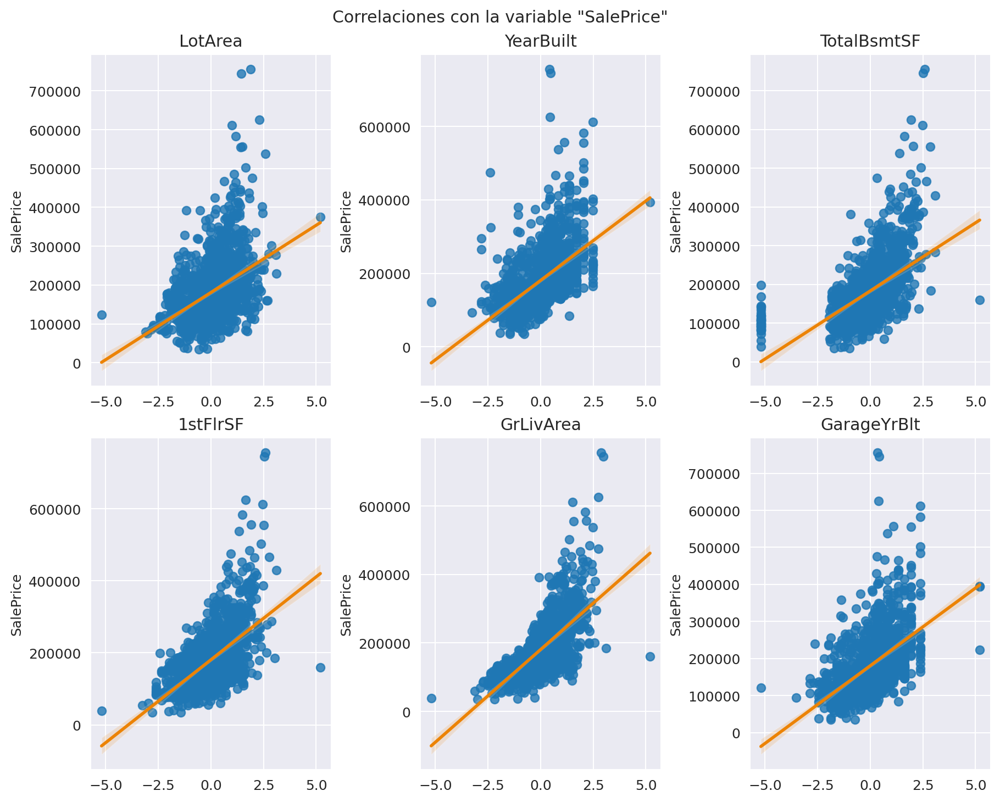

In [29]:
fig = plt.figure(

    layout  = 'constrained',

    figsize = (10,8),

    dpi     = 180

)

for x,y in zip(variables_normales,np.arange(6) + 1):

    plt.subplot(2,3,y)

    ax = sns.regplot(x=X_train_met_scaled[x],y=X_train_met_scaled['SalePrice'],line_kws={'color':'#EC8305'})

    plt.title(x)

    plt.xlabel(None)

    

plt.suptitle('Correlaciones con la variable "SalePrice"');

Las visualizaciones muestran que hay un grado de correlacion con el target, pero no del todo lineal. Ahora se verá que muestran las variables no normales:

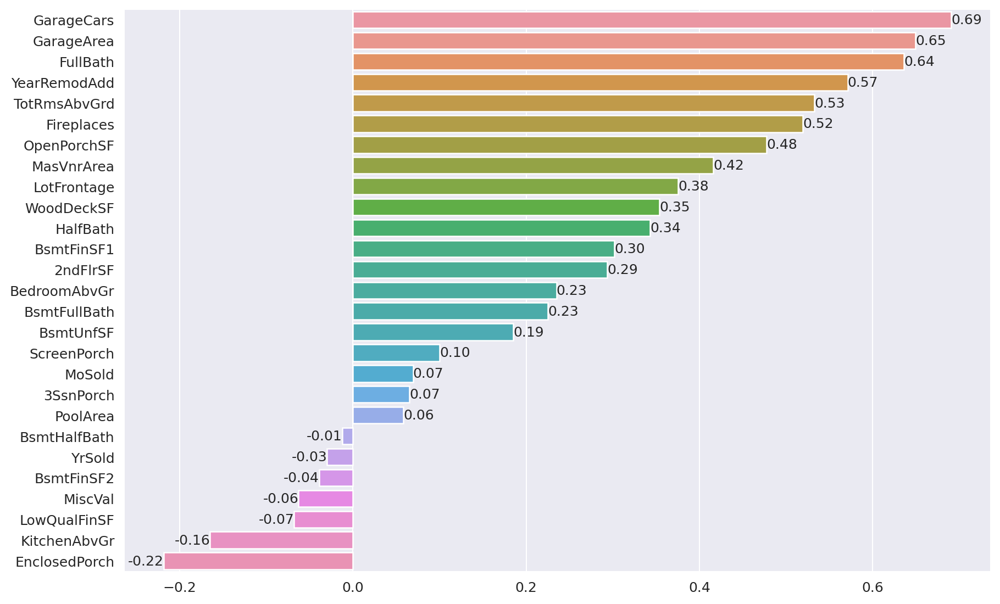

In [30]:
Corr_S = X_train_met_scaled[variables_no_norma + ['SalePrice']].corr('spearman')['SalePrice'].sort_values(ascending=False).drop(['SalePrice'],axis=0)



fig = plt.figure(

    layout  = 'constrained',

    figsize = (10,6),

    dpi     = 180

)

ax = sns.barplot(x=Corr_S.values,y=Corr_S.index)

ax.bar_label(ax.containers[0],fmt="%.2f");

Se puede observar que varias variables tienen poca linealidad con el target. Se verá los gráficos de dispersión para una mejor estimación:

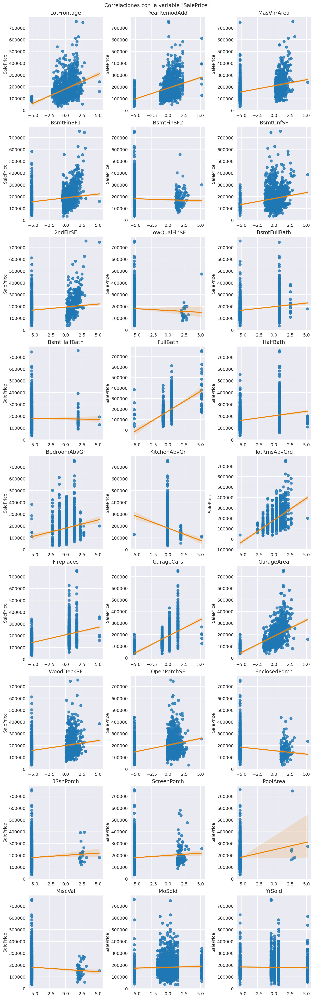

In [31]:
fig = plt.figure(

    layout  = 'constrained',

    figsize = (10,32),

    dpi     = 180

)

for x,y in zip(variables_no_norma,np.arange(27) + 1):

    plt.subplot(9,3,y)

    ax = sns.regplot(x=X_train_met_scaled[x],y=X_train_met_scaled['SalePrice'],line_kws={'color':'#EC8305'})

    plt.title(x)

    plt.xlabel(None)

    

plt.suptitle('Correlaciones con la variable "SalePrice"');

Se puede notar claramente que hay predictores que son practicamente independientes del target. Sin embargo, esto plantea preguntas acerca de las correlaciones entre las variables. Se observará un gráfico de calor para ello:

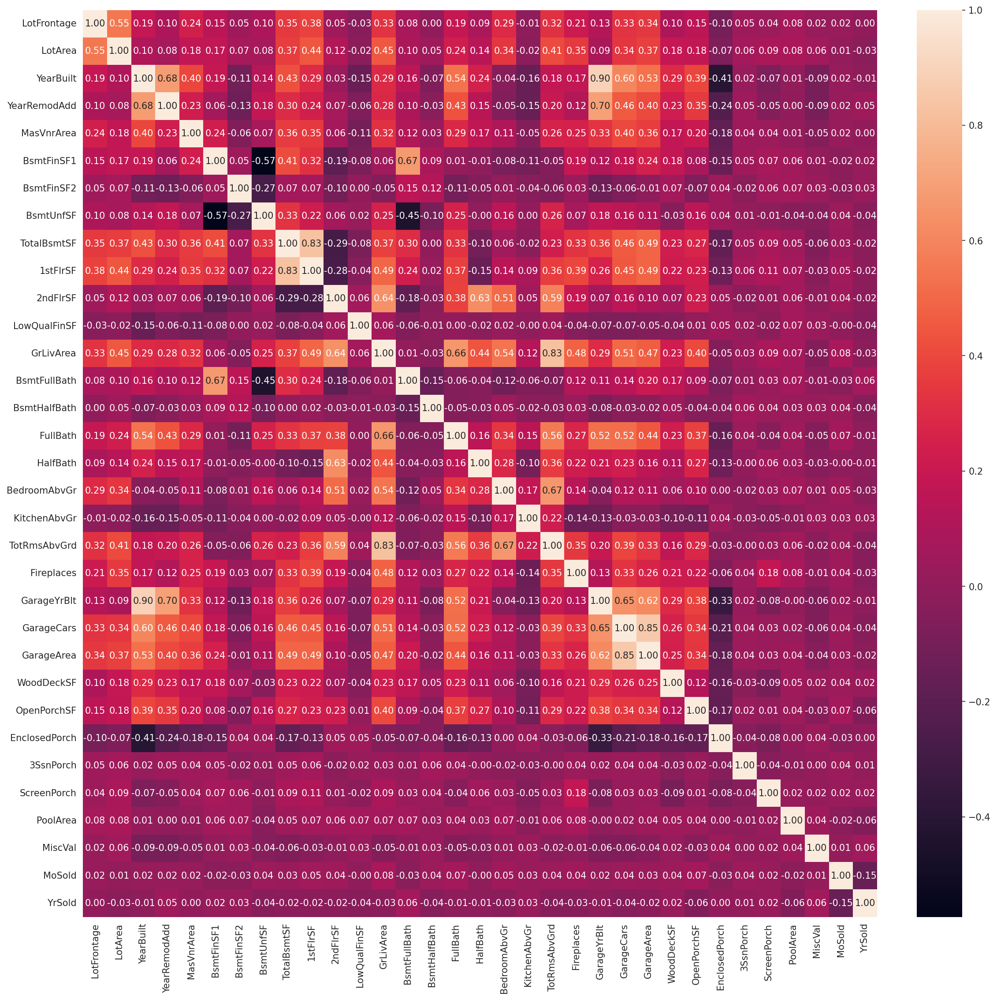

In [32]:
Corr_S = X_train_met_scaled.drop(['SalePrice'],axis=1).corr('spearman')



fig = plt.figure(

    layout  = 'constrained',

    figsize = (15,15),

    dpi     = 150

)



sns.heatmap(Corr_S,annot=True,fmt=".2f");

In [33]:
# Generando una lista con las variables que tienen menos correlacion con las demás, es decir, las que tienen menos información útil

var_sin_corr_importantes = []



for x in variables_normales + variables_no_norma:

    corr = X_train_met_scaled.corr('spearman')[x].drop([x],axis = 0)

    corr = corr[(corr.values >= 0.5)|(corr.values <= -0.5)]

    

    if len(corr) == 0:

        var_sin_corr_importantes.append(x)



var_sin_corr_importantes

['MasVnrArea',
 'BsmtFinSF2',
 'LowQualFinSF',
 'BsmtHalfBath',
 'KitchenAbvGr',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

Se puede observar que aquellas variables obtenidas del análisis de correlación son las que menos información útil entregan para la predicción del target, por lo que deben ser eliminadas del dataset que se ajustará el modelo. Ahora se revisará las correlaciones con las variables categóricas:

In [34]:
mann_whitney_u = []

kruskal_wallis = []



for x in X_train.select_dtypes('O').columns:

    if len(X_train[x].value_counts()) == 2:

        mann_whitney_u.append(x)

    else:

        kruskal_wallis.append(x)

Ya teniendo separados las variables, se procede a realizar cada prueba:

In [35]:
def Prueba_Mann_Whitney_U(variable):

    X_train['SalePrice'] = df_train['SalePrice']

    categorias = X_train[variable].value_counts().index



    grupo_1 = X_train[X_train[variable] == categorias[0]]['SalePrice']

    grupo_2 = X_train[X_train[variable] == categorias[1]]['SalePrice']



    statistic, p_value = stats.mannwhitneyu(grupo_1,grupo_2)



    return p_value



var_con_correlacion_MWU = []

drop_var_MWU = []

for x in mann_whitney_u:

    Prueba_Mann_Whitney_U(x)

    if Prueba_Mann_Whitney_U(x) < 0.05:

        var_con_correlacion_MWU.append(x)

    else:

        drop_var_MWU.append(x)

        

if len(var_con_correlacion_MWU) != 0:

    print('Según la prueba de Mann-Whitney U, hay evidencia estadística que indica que existe correlación entre el Target y las siguientes variables:')

    for x in var_con_correlacion_MWU:

        print(x)

else: 

    print('Ninguna de las variables tienen evidencia suficiente para afirmar una correlación con el Target')

Según la prueba de Mann-Whitney U, hay evidencia estadística que indica que existe correlación entre el Target y las siguientes variables:
CentralAir


In [36]:
def Prueba_Kruskal_Wallis(variable):

    categorias = [grupo['SalePrice'].values for categoria, grupo in X_train.groupby(variable)]

    statistic, p_value = stats.kruskal(*categorias)

    return p_value



var_con_correlacion_KW = []

drop_var_KW = []

for x in kruskal_wallis:

    Prueba_Kruskal_Wallis(x)

    

    if Prueba_Kruskal_Wallis(x) < 0.05:

        var_con_correlacion_KW.append(x)

    else:

        drop_var_KW.append(x)

        

if len(var_con_correlacion_KW) != 0:

    print('Según la prueba de Kruskal-Wallis, hay evidencia estadística que indica que existe correlación entre el Target y las siguientes variables:')

    for x in var_con_correlacion_KW:

        print(x)        

else:

    print('Ninguna de las variables tienen evidencia suficiente para afirmar una correlación con el Target')

Según la prueba de Kruskal-Wallis, hay evidencia estadística que indica que existe correlación entre el Target y las siguientes variables:
MSSubClass
MSZoning
Alley
LotShape
LandContour
LotConfig
Neighborhood
Condition1
Condition2
BldgType
HouseStyle
OverallQual
OverallCond
RoofStyle
RoofMatl
Exterior1st
Exterior2nd
MasVnrType
ExterQual
ExterCond
Foundation
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinType2
Heating
HeatingQC
Electrical
KitchenQual
Functional
FireplaceQu
GarageType
GarageFinish
GarageQual
GarageCond
PavedDrive
Fence
MiscFeature
SaleType
SaleCondition


In [37]:
variables_seleccionadas_prediccion = X_train.drop(var_sin_corr_importantes + drop_var_MWU + drop_var_KW,axis=1).columns

Ya teniendo identificadas que variables usar en la predicción de precios, se procede a codificar las variables categóricas.

#### Codificando los datos

Para codificar las variables categóricas, primero voy a clasificar las variables nominales y ordinales: 

In [38]:
# Separando los predictores categóricos nominales de los ordinales

nominales = [

    'MSSubClass',

    'MSZoning',

    'Street',

    'Alley',

    'Utilities',

    'LotConfig',

    'Neighborhood',

    'Condition1',

    'Condition2',

    'BldgType',

    'HouseStyle',

    'RoofStyle',

    'RoofMatl',

    'Exterior1st',

    'Exterior2nd',

    'MasVnrType',

    'Foundation',

    'Heating',

    'CentralAir',

    'Electrical',

    'Functional',

    'GarageType',

    'MiscFeature',

    'SaleType',

    'SaleCondition'

]



nominales_seleccionadas = [x for x in nominales if x in variables_seleccionadas_prediccion]



ordinales_seleccionadas = [x for x in vars_categoricas if x not in nominales and x in variables_seleccionadas_prediccion]

Ahora separaré las variables de alta cardinalidad de las de baja cardinalidad:

In [39]:
# Solo las variables categóricas nominales tienen alta cardinalidad, asi que simplemente separe la cardinalidad en ellos

nom_alta_card = [x for x in nominales_seleccionadas if len(X_train[x].value_counts()) > 10]

nom_baja_card = [x for x in nominales_seleccionadas if len(X_train[x].value_counts()) <= 10]

Una vez clasificadas las variables categóricas por su cardinalidad, procedo a hacer la codificación. Para ello, empezaré codificando las variables con alta cardinalidad usando el método del **Target Encoding**:

In [40]:
# Importando la herramienta del Target Encoder

from category_encoders import TargetEncoder



codificador = TargetEncoder(cols=nom_alta_card)



# Creando un dataset con las variables categóricas codificadas y escaladas, debido a que el Target Encoding me da valores muy grandes gracias a mi variable objetivo

X_train_cat_cod = pd.DataFrame()

X_test_cat_cod = pd.DataFrame()



# Codificando las variables de ambos datasets

X_train_cat_cod[nom_alta_card] = codificador.fit_transform(X_train[nom_alta_card],y_train)

X_test_cat_cod[nom_alta_card] = codificador.transform(X_test[nom_alta_card])

Ahora codificaré a las variables de baja cardinalidad utilizando la **Codificación por Frecuencia**:

In [41]:
# Calculando las frecuancias para cada variable categórica

for predictor in nom_baja_card:

    X_train_cat_cod[predictor] = X_train[predictor].map(X_train[predictor].value_counts(normalize=True))

    X_test_cat_cod[predictor] = X_test[predictor].map(X_train[predictor].value_counts(normalize=True))

Mi siguiente paso es codificar las variables ordinales, para eso utilizare el Codificador Ordinal de Scikit-Learn:

In [42]:
# Importando el OrdinalEncoder

from sklearn.preprocessing import OrdinalEncoder



# Creando el diccionario con las variables ordinales

ordinales_dict = {x : datos_categoricos[x][::-1] for x in ordinales_seleccionadas}



codificador_ordinal = OrdinalEncoder(categories = list(ordinales_dict.values()))



X_train_cat_cod[list(ordinales_dict.keys())] = codificador_ordinal.fit_transform(X_train[list(ordinales_dict.keys())])

X_test_cat_cod[list(ordinales_dict.keys())] = codificador_ordinal.transform(X_test[list(ordinales_dict.keys())])

Ya teniendo codificadas mis variables categóricas, toca juntar las variables en un dataset para cada conjunto:

In [43]:
# Dataset parcialmente escalado y completamente codificado

X_train_scaled_encoded = pd.concat([X_train_met_scaled,X_train_cat_cod],axis = 1)

X_train_scaled_encoded = X_train_scaled_encoded[variables_seleccionadas_prediccion].drop(['SalePrice'],axis = 1)



X_test_scaled_encoded = pd.concat([X_test_met_scaled,X_test_cat_cod],axis = 1)

X_test_scaled_encoded = X_test_scaled_encoded[variables_seleccionadas_prediccion[:61]]

#### Repaso de la Información Útil de cada Predictor antes de la predicción

Ya teniendo datasets del conjunto de entrenamiento y prueba escalados y codificados, se hará un repaso de la información que entrega cada predictor en función del Target:

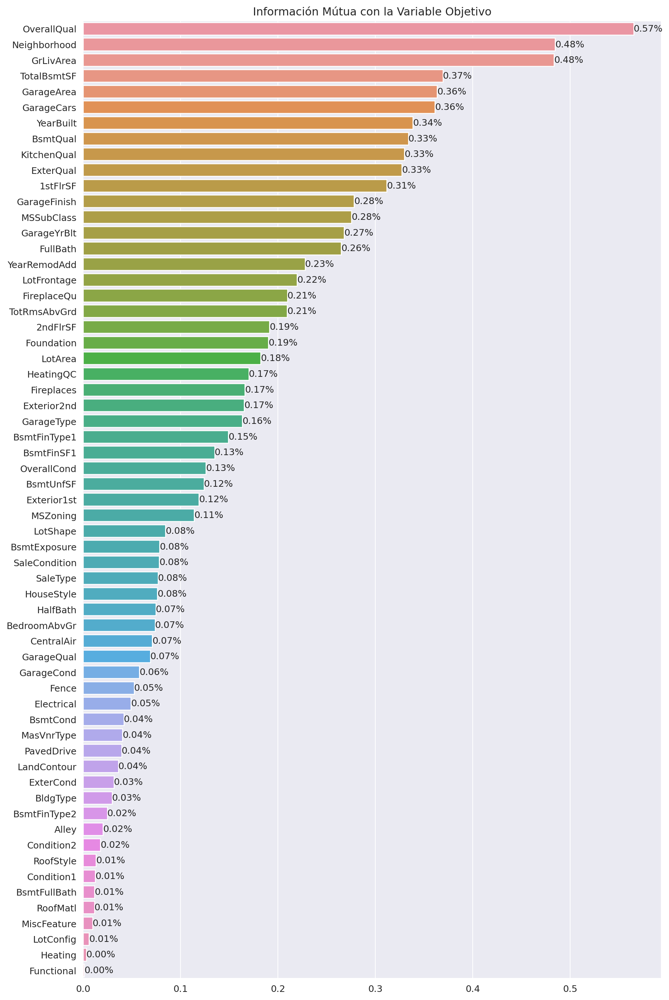

In [44]:
# Importando las herramientas para la selección de predictores, que en este caso, se trata de un problema de regresión

from sklearn.feature_selection import mutual_info_regression, f_regression



# Calculando la Información Mútua

info_mutua = mutual_info_regression(X_train_scaled_encoded,y_train)



info_mutua_s = pd.Series(info_mutua,index=X_train_scaled_encoded.columns)



plt.figure(

    figsize = (10,15),

    dpi     = 180,

    layout  = 'constrained')



plt.title('Información Mútua con la Variable Objetivo')



ax = sns.barplot(

    x = info_mutua_s.sort_values(ascending=False).values,

    y = info_mutua_s.sort_values(ascending=False).index

)



ax.bar_label(ax.containers[0], fmt = '%.2f%%');

Se puede observar que a pesar de las pruebas de correlación calculadas anteriormente, aún hay predictores que no entregan mucha información para predecir los precios de las casas. Ante esto, se realizarán diversas predicciones para comprobar la precisión del modelo.

## Creación del Modelo: Bosque Aleatorio y XGBoost

El objetivo desde el inicio de este proyecto ha sido predecir los precios de casas a partir de información entregada por Kaggle. Desde el comienzo se tenía pensado en usar los algoritmos de ensamblados de Bosque Aleatorio y XGBoost, siendo este último un algoritmo de gradiente. Para comenzar con las predicciones, se utilizarán las métricas de predicción de precisión, junto al RMSE:

In [45]:
from sklearn.model_selection import train_test_split, cross_val_score

from sklearn.ensemble import RandomForestRegressor

from xgboost import XGBRegressor

from sklearn.metrics import mean_squared_error



# Creando el conjunto de validacion

train_X, val_X, train_y, val_y = train_test_split(X_train_scaled_encoded,y_train,test_size = 0.2,random_state = 42)



# Modelo del Bosque Aleatorio

Modelo_BA = RandomForestRegressor(random_state=42)



cv_scores = cross_val_score(Modelo_BA,train_X,train_y,cv = 5)



print(f'Rendimiento de la Validación Cruzada: {cv_scores}')

print(f'El puntaje promedio de la Validación Cruzada: {cv_scores.mean():.3f}')

Rendimiento de la Validación Cruzada: [0.88831131 0.76515491 0.82629853 0.89071469 0.87539074]
El puntaje promedio de la Validación Cruzada: 0.849


In [46]:
# Se revisará los predictores con mayor importancia

Modelo_BA.fit(X_train_scaled_encoded,y_train)



Feature_Importance_BA = pd.Series(Modelo_BA.feature_importances_,index=X_train_scaled_encoded.columns)



for x,y in zip(Feature_Importance_BA.sort_values(ascending=False).index,Feature_Importance_BA.sort_values(ascending=False).values):

    print(f'{x} {y:.3f}')

OverallQual 0.532
GrLivArea 0.101
Neighborhood 0.086
2ndFlrSF 0.035
TotalBsmtSF 0.034
1stFlrSF 0.030
BsmtFinSF1 0.028
GarageCars 0.021
GarageArea 0.013
LotArea 0.011
TotRmsAbvGrd 0.008
YearRemodAdd 0.007
LotFrontage 0.007
FullBath 0.006
MSSubClass 0.006
YearBuilt 0.006
BsmtUnfSF 0.005
KitchenQual 0.005
BsmtQual 0.005
GarageYrBlt 0.004
OverallCond 0.004
FireplaceQu 0.003
BsmtExposure 0.003
Exterior1st 0.002
GarageType 0.002
BedroomAbvGr 0.002
ExterQual 0.002
GarageFinish 0.002
SaleCondition 0.002
Exterior2nd 0.002
BsmtFinType1 0.002
Fireplaces 0.002
CentralAir 0.002
HalfBath 0.001
LotConfig 0.001
BsmtFullBath 0.001
LandContour 0.001
RoofStyle 0.001
MasVnrType 0.001
LotShape 0.001
BsmtCond 0.001
GarageQual 0.001
SaleType 0.001
HeatingQC 0.001
MSZoning 0.001
BsmtFinType2 0.001
Condition1 0.001
HouseStyle 0.001
ExterCond 0.001
Functional 0.001
GarageCond 0.001
RoofMatl 0.001
Foundation 0.001
Condition2 0.000
Alley 0.000
Fence 0.000
BldgType 0.000
PavedDrive 0.000
Electrical 0.000
MiscFeatu

In [47]:
for x in [0,0.001,0.002,0.003,0.004]:

    drop_vars = Feature_Importance_BA[Feature_Importance_BA < x]

    train_X,val_X,train_y,val_y = train_test_split(X_train_scaled_encoded.drop(drop_vars.index,axis = 1),y_train,test_size=0.2,random_state=42)



    cv_scores = cross_val_score(Modelo_BA,train_X,train_y,cv = 5)



    print(f'Rendimiento de la Validación Cruzada con drop de {x}: {cv_scores}')

    print(f'El puntaje promedio de la Validación Cruzada con drop de {x}: {cv_scores.mean():.3f}')

    print('\n')

Rendimiento de la Validación Cruzada con drop de 0: [0.88831131 0.76515491 0.82629853 0.89071469 0.87539074]
El puntaje promedio de la Validación Cruzada con drop de 0: 0.849


Rendimiento de la Validación Cruzada con drop de 0.001: [0.8988416  0.76944775 0.83371793 0.88783278 0.87217727]
El puntaje promedio de la Validación Cruzada con drop de 0.001: 0.852


Rendimiento de la Validación Cruzada con drop de 0.002: [0.90210814 0.76837767 0.82302244 0.88854641 0.87712853]
El puntaje promedio de la Validación Cruzada con drop de 0.002: 0.852


Rendimiento de la Validación Cruzada con drop de 0.003: [0.89736233 0.76144452 0.82428144 0.89047959 0.87827844]
El puntaje promedio de la Validación Cruzada con drop de 0.003: 0.850


Rendimiento de la Validación Cruzada con drop de 0.004: [0.90894823 0.75607906 0.8275526  0.88413556 0.87634732]
El puntaje promedio de la Validación Cruzada con drop de 0.004: 0.851




In [48]:
# Generando una nueva predicción pero eliminando las variables innecesarias

train_X = X_train_scaled_encoded.drop(Feature_Importance_BA[Feature_Importance_BA<0.001].index,axis=1)

test_X = X_test_scaled_encoded.drop(Feature_Importance_BA[Feature_Importance_BA<0.001].index,axis=1)



Modelo_BA.fit(train_X,y_train)

RandomForestRegressor(random_state=42)

In [49]:
Modelo_BA.predict(test_X)

array([127165.58, 154919.  , 184031.82, ..., 161904.  , 113330.75,
       196502.48])

In [50]:
# Observando el rendimiento de XGBoost

Modelo_XGB = XGBRegressor()



drop_vars = Feature_Importance_BA[Feature_Importance_BA < 0.001]

train_X,val_X,train_y,val_y = train_test_split(X_train_scaled_encoded.drop(drop_vars.index,axis = 1),y_train,test_size=0.2,random_state=42)



cv_scores = cross_val_score(Modelo_XGB,train_X,train_y,cv = 5)



print(f'Rendimiento de la Validación Cruzada: {cv_scores}')

print(f'El puntaje promedio de la Validación Cruzada: {cv_scores.mean():.3f}')

Rendimiento de la Validación Cruzada: [0.80303921 0.75986322 0.85058025 0.87672864 0.85468111]
El puntaje promedio de la Validación Cruzada: 0.829


In [51]:
train_X = X_train_scaled_encoded.drop(Feature_Importance_BA[Feature_Importance_BA<0.001].index,axis=1)

test_X = X_test_scaled_encoded.drop(Feature_Importance_BA[Feature_Importance_BA<0.001].index,axis=1)



Modelo_XGB.fit(train_X,y_train)



Modelo_XGB.predict(test_X)

array([117383.766, 145561.92 , 190335.72 , ..., 173597.66 , 114552.26 ,
       183076.56 ], dtype=float32)

Se puede observar que en este proyecto, el algoritmo del Bosque Aleatorio obtuvo ligeramente un mejor rendimiento que XGBoost, sin embargo se mantenían en el mismo umbral con una precisión de **84% a 86%**.

Si bien es cierto que debería hacer un hypertunning de parámetros, mi objetivo en este proyecto era poder practicar y desarrollar modelos de predicción para resolver un problema de regresión como lo es la predicción de precios de casas. Ya habiendo cumplido con ello, doy por finalizado este proyecto.